In [1]:
pip install httpx;

  Using cached httpx-0.27.0-py3-none-any.whl.metadata (7.2 kB)
  Using cached httpcore-1.0.5-py3-none-any.whl.metadata (20 kB)
  Using cached h11-0.14.0-py3-none-any.whl.metadata (8.2 kB)
Using cached httpx-0.27.0-py3-none-any.whl (75 kB)
Using cached httpcore-1.0.5-py3-none-any.whl (77 kB)
Using cached h11-0.14.0-py3-none-any.whl (58 kB)
Note: you may need to restart the kernel to use updated packages.


In [1]:
pip install pandas;

Note: you may need to restart the kernel to use updated packages.


In [1]:
import pandas as pd
import requests
from bs4 import BeautifulSoup
import time
from urllib.parse import urljoin
import time
from requests.adapters import HTTPAdapter
from urllib3.util.retry import Retry
import numpy as np
#import httpx


In [ ]:
import asyncio
import nest_asyncio

nest_asyncio.apply()


def process_url(url):
    if not url.startswith('http'):

       url = urljoin('https://www.sdna.gr', url)

    return url

headers = {
    'User-Agent': 'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/91.0.4472.124 Safari/537.36',
    'Referer': 'https://www.sdna.gr'
}

async def get_with_retries(url, headers, max_retries=3):
    retries = 0
    while retries < max_retries:
        try:
            async with httpx.AsyncClient() as client:
                response = await client.get(url, headers=headers)
                response.raise_for_status()
                return response
        except (httpx.RequestError, httpx.HTTPStatusError) as e:
            print(f"Error retrieving {url}: {e}")
            retries += 1
            await asyncio.sleep(3 ** retries)

    raise Exception(f"Failed to retrieve {url} after {max_retries} retries")

base_url = 'https://www.sdna.gr/blogs?page='
urls = []

async def main():
    for page_num in range(4, 118):
        print(f"Processing page: {page_num}")
        url = base_url + str(page_num)
        try:
            response = await get_with_retries(url, headers=headers)
            soup = BeautifulSoup(response.text, 'html.parser')
            sdna_articles = soup.find_all('article')
            print(f"Found {len(sdna_articles)} articles on page {page_num}")

            for i, article in enumerate(sdna_articles):
                link_tag = article.find('a')

                if link_tag:
                    raw_url = link_tag["href"]
                    processed_url = process_url(raw_url)
                    urls.append(processed_url)
                    print(f"Added URL from article {i+1} on page {page_num}: {processed_url}")
                else:
                    print(f"Missing link in article {i+1} on page {page_num}")

            await asyncio.sleep(5)

        except Exception as e:
            print(f"Failed to retrieve page {page_num}: {e}")

    data = {'URL': urls}
    print("Scraping completed. Total URLs collected:", len(urls))
    print(data)


asyncio.run(main())


Processing page: 4
Found 66 articles on page 4
Added URL from article 1 on page 4: https://www.sdna.gr/mpasket/1206269_i-alitheia-toy-ataman-peri-zileias-kai-i-asylia-toy-mpartzoka
Added URL from article 2 on page 4: https://www.sdna.gr/podosfairo/1205750_floridis-kalei-gkagkatsi
Added URL from article 3 on page 4: https://www.sdna.gr/podosfairo/1205867_logiko-moydiasma-tora-na-stirihtei-horis-asteriskoys
Added URL from article 4 on page 4: https://www.sdna.gr/podosfairo/1205736_toys-xanapire-aihmalotoys
Added URL from article 5 on page 4: https://www.sdna.gr/mpasket/1205504_o-panathinaikos-hreiazetai-ton-kalo-nan-gia-na-epistrepsei-stin-seira-vids
Added URL from article 6 on page 4: https://www.sdna.gr/mpasket/1205626_dyo-alloi-kosmoi-kai-enas-panathinaikos-poy-den-ton-fthanete-oyte-se-treis-zoes
Added URL from article 7 on page 4: https://www.sdna.gr/podosfairo/1205670_pos-dialegeis-proponiti-gia-tin-ethniki
Added URL from article 8 on page 4: https://www.sdna.gr/stibos/1205633_alma-

In [ ]:
sdna_urls = pd.DataFrame(urls)


,0
0,https://www.sdna.gr/mpasket/1206269_i-alitheia...
1,https://www.sdna.gr/podosfairo/1205750_floridi...
2,https://www.sdna.gr/podosfairo/1205867_logiko-...
3,https://www.sdna.gr/podosfairo/1205736_toys-xa...
4,https://www.sdna.gr/mpasket/1205504_o-panathin...
...,...
1705,https://www.sdna.gr/podosfairo/1110719_i-pragm...
1706,https://www.sdna.gr/mpasket/1110714_apo-2009-e...
1707,https://www.sdna.gr/podosfairo/1110687_siga-mi...
1708,https://www.sdna.gr/podosfairo/1110494_emeine-...


In [ ]:
sdna_urls.rename(columns={
    0: 'URL',
}, inplace=True)

In [ ]:
full_articles_list = []

headers = {
    'User-Agent': 'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/91.0.4472.124 Safari/537.36',
    'Referer': 'https://www.sdna.gr'
}

for index, processed_url in enumerate(sdna_urls['URL']):
    full_article_dict = {}

    try:
        response = httpx.get(processed_url, headers=headers)
        soup = BeautifulSoup(response.content, 'html.parser')
        full_article_dict["site"] = "sdna.gr"
        full_article_dict["url"] = sdna_urls["URL"]

        title_tag = soup.find("h1")
        title = title_tag.get_text(strip=True) if title_tag else 'No Title Found'
        full_article_dict['title'] = title

        author_tag = soup.find('ul', {"class": "article__authors"})
        author = author_tag.get_text(strip=True) if author_tag else 'No Author Found'
        full_article_dict['author'] = author

        datetime_tag = soup.find("time", {"class": "default-date"})
        datetime = datetime_tag.get_text(strip=True) if datetime_tag else 'No Datetime Found'
        full_article_dict['datetime'] = datetime

        article_lead_tag = soup.find("div", {"class": "article__teaser resize-font"})
        article_lead = article_lead_tag.text.strip() if article_lead_tag else "No article_lead Found"
        full_article_dict['article_lead'] = article_lead

        text_tag = soup.find("div", {"class": "article__body resize-font has-advs"})
        text = text_tag.text.strip() if text_tag else "No Text Found"
        full_article_dict["text"] = text

    except Exception as e:
        print(f"Error processing {processed_url}: {e}")
        full_article_dict = {
            'site': "sdna.gr",
            'url': processed_url,
            'title': 'Error',
            'author': 'Error',
            'datetime': 'Error',
            'article_lead': 'Error',
            'text': 'Error'
        }
    print(f"Processed {index + 1}/{len(sdna_urls['URL'])}: {processed_url}")
    full_articles_list.append(full_article_dict)
    time.sleep(5)

sdna_2023_2024 = pd.DataFrame(full_articles_list)




Processed 1/1710: https://www.sdna.gr/mpasket/1206269_i-alitheia-toy-ataman-peri-zileias-kai-i-asylia-toy-mpartzoka


KeyboardInterrupt: 

In [14]:
sdna_2023_2024.to_csv("/content/drive/MyDrive/sdna_2023_2024", index = False)


In [8]:
sdna_2023_2024 = pd.read_csv("/content/drive/MyDrive/sdna_2023_2024")

In [ ]:
full_articles_list = []

headers = {
    'User-Agent': 'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/91.0.4472.124 Safari/537.36',
    'Referer': 'https://www.sdna.gr'
}


for index, row in sdna_2023_2024.iterrows():
    full_article_dict = {}

    try:
       
        response = httpx.get(row['url'], headers=headers)
        soup = BeautifulSoup(response.content, 'html.parser')

        full_article_dict["site"] = "sdna.gr"
        full_article_dict["url"] = row['url']
        full_article_dict["title"] = row['title']
        full_article_dict["author"] = row['author']
        full_article_dict["datetime"] = row['datetime']
        full_article_dict["article_lead"] = row['article_lead']
        full_article_dict["text"] = row['text']

        # Extract the section from the article
        section_tag = soup.find("div", {"class": "article__sport-tags"})
        section = section_tag.text.strip() if section_tag else "No Section Found"
        full_article_dict['section'] = section

    except Exception as e:
        print(f"Error processing {row['url']}: {e}")
        full_article_dict = {
            'site': "sdna.gr",
            'url': row['url'],
            'title': 'Error',
            'author': 'Error',
            'datetime': 'Error',
            'article_lead': 'Error',
            'text': 'Error',
            'section': 'Error'
        }

    print(f"Processed {index + 1}/{len(sdna_2023_2024)}: {row['url']}")
    full_articles_list.append(full_article_dict)
    time.sleep(2)


sdna_2023_2024_2 = pd.DataFrame(full_articles_list)


Processed 1/1709: https://www.sdna.gr/podosfairo/1205750_floridis-kalei-gkagkatsi
Processed 2/1709: https://www.sdna.gr/podosfairo/1205867_logiko-moydiasma-tora-na-stirihtei-horis-asteriskoys
Processed 3/1709: https://www.sdna.gr/podosfairo/1205736_toys-xanapire-aihmalotoys
Processed 4/1709: https://www.sdna.gr/mpasket/1205504_o-panathinaikos-hreiazetai-ton-kalo-nan-gia-na-epistrepsei-stin-seira-vids
Processed 5/1709: https://www.sdna.gr/mpasket/1205626_dyo-alloi-kosmoi-kai-enas-panathinaikos-poy-den-ton-fthanete-oyte-se-treis-zoes
Processed 6/1709: https://www.sdna.gr/podosfairo/1205670_pos-dialegeis-proponiti-gia-tin-ethniki
Processed 7/1709: https://www.sdna.gr/stibos/1205633_alma-eis-miltos
Processed 8/1709: https://www.sdna.gr/mpasket/1205564_o-anthropos-poy-kratise-ti-floga-zontani
Processed 9/1709: https://www.sdna.gr/podosfairo/1205526_i-aek-prepei-na-gyrisei-selida
Processed 10/1709: https://www.sdna.gr/podosfairo/1205467_apantiseis-gia-olo-fasma-tis-atzentas
Processed 11/1709

In [ ]:
sdna_2023_2024['datetime'] = pd.to_datetime(sdna_2023_2024['datetime'], format='%d-%m-%Y %H:%M', errors='coerce')

In [ ]:
sdna_2023_2024['year'] = pd.DatetimeIndex(sdna_2023_2024['datetime']).year
sdna_2023_2024['month'] = pd.DatetimeIndex(sdna_2023_2024['datetime']).month
sdna_2023_2024['day'] = pd.DatetimeIndex(sdna_2023_2024['datetime']).day
sdna_2023_2024['hour'] = pd.DatetimeIndex(sdna_2023_2024['datetime']).hour

In [ ]:
pd.set_option('display.max_rows', 1724)

In [11]:
sdna_2023_2024.loc[1709:, 'datetime'] = pd.to_datetime(sdna_2023_2024.loc[1709:, 'datetime'], format='%d-%m-%Y %H:%M', errors='coerce')
print(sdna_2023_2024.loc[1709:, ['datetime', 'title', 'section']])


                 datetime                                              title  \
1709  2023-08-11 00:38:00     Γυρίζει αλώβητος, ο χρόνος λειτουργεί υπέρ του   
1710  2023-08-10 20:30:00               Συγκάτοικοι είμαστε όλοι στην τρέλα…   
1711  2023-08-10 19:07:00  Απαράγραπτο: Το ρόστερ, ποτέ δεν θα νικήσει το...   
1712  2023-08-10 18:11:00  Το Χόλιγουντ έρχεται να γυρίσει το remake από ...   
1713  2023-08-10 17:01:00     Γυρίζει αλώβητος, ο χρόνος λειτουργεί υπέρ του   
1714  2023-08-10 12:20:00                Σκέψου τι θα γίνεται στον Βοτανικό!   
1715  2023-08-10 08:30:00  Δεν έχουμε καταλάβει ποια ομάδα νίκησε ο Παναθ...   
1716  2023-08-09 23:53:00  Ελλάς, Ευρώπη, Panathinaikos, με ρεσιτάλ Γιοβά...   
1717  2023-08-09 14:14:00  Το δάχτυλο πίσω από το οποίο κρυβόμαστε είναι ...   
1718  2023-08-09 11:26:00  Η βραδιά που καλοσυστήθηκε στο ευρύ κοινό ο Ρο...   
1719  2023-08-08 23:35:00  Η δολοφονία του Μιχάλη της ΑΕΚ, το κακό στη Νέ...   
1720  2023-08-08 22:21:00  Εχουν στερέψε

In [12]:

sdna_2023_2024.loc[1709:, 'year'] = pd.DatetimeIndex(sdna_2023_2024.loc[1709:, 'datetime']).year
sdna_2023_2024.loc[1709:, 'month'] = pd.DatetimeIndex(sdna_2023_2024.loc[1709:, 'datetime']).month
sdna_2023_2024.loc[1709:, 'day'] = pd.DatetimeIndex(sdna_2023_2024.loc[1709:, 'datetime']).day
sdna_2023_2024.loc[1709:, 'hour'] = pd.DatetimeIndex(sdna_2023_2024.loc[1709:, 'datetime']).hour

print(sdna_2023_2024.loc[1709:, ['datetime', 'year', 'month', 'day', 'hour']])


                 datetime    year  month   day  hour
1709  2023-08-11 00:38:00  2023.0    8.0  11.0   0.0
1710  2023-08-10 20:30:00  2023.0    8.0  10.0  20.0
1711  2023-08-10 19:07:00  2023.0    8.0  10.0  19.0
1712  2023-08-10 18:11:00  2023.0    8.0  10.0  18.0
1713  2023-08-10 17:01:00  2023.0    8.0  10.0  17.0
1714  2023-08-10 12:20:00  2023.0    8.0  10.0  12.0
1715  2023-08-10 08:30:00  2023.0    8.0  10.0   8.0
1716  2023-08-09 23:53:00  2023.0    8.0   9.0  23.0
1717  2023-08-09 14:14:00  2023.0    8.0   9.0  14.0
1718  2023-08-09 11:26:00  2023.0    8.0   9.0  11.0
1719  2023-08-08 23:35:00  2023.0    8.0   8.0  23.0
1720  2023-08-08 22:21:00  2023.0    8.0   8.0  22.0
1721  2023-08-08 14:39:00  2023.0    8.0   8.0  14.0


In [9]:
sdna_2023_2024["text"] = sdna_2023_2024["text"].str.replace("\n", "")
sdna_2023_2024["text"] = sdna_2023_2024["text"].str.replace("\xa0", "")
sdna_2023_2024["text"] = sdna_2023_2024["text"].str.replace("#o_tweeteras", "")
sdna_2023_2024["text"] = sdna_2023_2024["text"].str.replace("\'", "")
sdna_2023_2024["text"] = sdna_2023_2024["text"].str.replace(" *Για να ενημερώνεσαι έγκυρα και έγκαιρα για όλες τις αθλητικές εξελίξεις επισκέπτεσαι τοsdna, για να γεύεσαι τις καλύτερες γεύσεις, το καλύτερο κρέας της πόλης και άλλες πολλές επιλογές επισκέπτεσαι τοFilothei65Souvlaki", "")
sdna_2023_2024["text"] = sdna_2023_2024["text"].str.replace("\nΕκείνη", "Εκείνη")


In [15]:
file_path = r'C:\Users\stath\OneDrive\Υπολογιστής\sdna_2023_2024'

In [16]:
sdna_2023_2024 = pd.read_csv(file_path)

In [4]:
pd.set_option('display.max_rows', 1721)

In [17]:
sdna_2023_2024;

In [18]:
sdna_2023_2024_full_text = sdna_2023_2024['text'].str.cat(sep = ' ')

In [16]:
sdna_2023_2024_full_text;


In [16]:
pip install matplotlib


     ---------------------------------------- 0.0/165.9 kB ? eta -:--:--
     ------- ------------------------------- 30.7/165.9 kB 1.3 MB/s eta 0:00:01
     -------------------------------------  163.8/165.9 kB 1.6 MB/s eta 0:00:01
     -------------------------------------  163.8/165.9 kB 1.6 MB/s eta 0:00:01
     ------------------------------------ 165.9/165.9 kB 766.9 kB/s eta 0:00:00
   ---------------------------------------- 0.0/8.0 MB ? eta -:--:--
   - -------------------------------------- 0.2/8.0 MB 5.0 MB/s eta 0:00:02
   -- ------------------------------------- 0.4/8.0 MB 4.5 MB/s eta 0:00:02
   --- ------------------------------------ 0.8/8.0 MB 5.4 MB/s eta 0:00:02
   ---- ----------------------------------- 0.8/8.0 MB 4.3 MB/s eta 0:00:02
   ----- ---------------------------------- 1.1/8.0 MB 4.7 MB/s eta 0:00:02
   ------- -------------------------------- 1.4/8.0 MB 5.0 MB/s eta 0:00:02
   -------- ------------------------------- 1.6/8.0 MB 5.0 MB/s eta 0:00:02
   --

In [19]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud

In [11]:
!pip install spacy;



In [4]:
import spacy
print(spacy.__version__)

3.7.5


In [86]:
!python -m spacy download el_core_news_md


     ---------------------------------------- 0.0/42.9 MB ? eta -:--:--
     ---------------------------------------- 0.0/42.9 MB ? eta -:--:--
     ---------------------------------------- 0.0/42.9 MB ? eta -:--:--
     --------------------------------------- 0.0/42.9 MB 131.3 kB/s eta 0:05:27
     --------------------------------------- 0.0/42.9 MB 146.3 kB/s eta 0:04:54
     --------------------------------------- 0.0/42.9 MB 178.6 kB/s eta 0:04:01
     --------------------------------------- 0.1/42.9 MB 234.9 kB/s eta 0:03:03
     --------------------------------------- 0.1/42.9 MB 309.1 kB/s eta 0:02:19
     --------------------------------------- 0.2/42.9 MB 459.5 kB/s eta 0:01:34
     --------------------------------------- 0.3/42.9 MB 770.1 kB/s eta 0:00:56
     ---------------------------------------- 0.5/42.9 MB 1.2 MB/s eta 0:00:36
      --------------------------------------- 0.7/42.9 MB 1.6 MB/s eta 0:00:27
      --------------------------------------- 0.9/42.9 MB 1.8 MB/s

In [5]:
nlp = spacy.load('el_core_news_md')

In [19]:
!pip install wordcloud


   ---------------------------------------- 0.0/301.4 kB ? eta -:--:--
   - -------------------------------------- 10.2/301.4 kB ? eta -:--:--
   ----- --------------------------------- 41.0/301.4 kB 487.6 kB/s eta 0:00:01
   --------- ----------------------------- 71.7/301.4 kB 491.5 kB/s eta 0:00:01
   ------------------- ------------------ 153.6/301.4 kB 833.5 kB/s eta 0:00:01
   ---------------------------------------  297.0/301.4 kB 1.3 MB/s eta 0:00:01
   ---------------------------------------  297.0/301.4 kB 1.3 MB/s eta 0:00:01
   -------------------------------------- 301.4/301.4 kB 930.2 kB/s eta 0:00:00


In [6]:
import wordcloud

In [21]:
!pip install seaborn


   ---------------------------------------- 0.0/294.9 kB ? eta -:--:--
   - -------------------------------------- 10.2/294.9 kB ? eta -:--:--
   ---- ---------------------------------- 30.7/294.9 kB 330.3 kB/s eta 0:00:01
   ----- --------------------------------- 41.0/294.9 kB 281.8 kB/s eta 0:00:01
   ------------ -------------------------- 92.2/294.9 kB 476.3 kB/s eta 0:00:01
   -------------- ----------------------- 112.6/294.9 kB 547.6 kB/s eta 0:00:01
   -------------- ----------------------- 112.6/294.9 kB 547.6 kB/s eta 0:00:01
   ------------------------------- ------ 245.8/294.9 kB 838.1 kB/s eta 0:00:01
   ------------------------------- ------ 245.8/294.9 kB 838.1 kB/s eta 0:00:01
   ------------------------------------ - 286.7/294.9 kB 737.3 kB/s eta 0:00:01
   ------------------------------------ - 286.7/294.9 kB 737.3 kB/s eta 0:00:01
   -------------------------------------- 294.9/294.9 kB 608.3 kB/s eta 0:00:00


In [7]:
import seaborn as sns

In [28]:
print(len(sdna_2023_2024_full_text))


7280879


In [18]:
nlp.max_length = 7280879

In [8]:
full_doc = nlp(sdna_2023_2024_full_text)

NameError: name 'sdna_2023_2024_full_text' is not defined

In [7]:
!pip install joblib

In [11]:
from joblib import dump, load


In [12]:
#dump(full_doc, 'full_doc.joblib')



NameError: name 'full_doc' is not defined

In [14]:
full_doc = load('full_doc.joblib')

In [8]:
sdna_2023_2024['section'].unique()



array(['Ποδόσφαιρο', 'Μπάσκετ', 'Στίβος', nan, 'Τένις', 'Βόλεϊ',
       'Auto - Moto', 'Πόλο', 'Σύγκρουση τρένων στα Τέμπη', 'Άρση Βαρών',
       'Κολύμβηση', 'Tweets'], dtype=object)

In [ ]:
# plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height() / 2, str(value),   ha='center', va='center', color='black', fontsize=10, fontweight='bold')

In [210]:
sdna_2023_2024.to_csv(file_path, index=False)

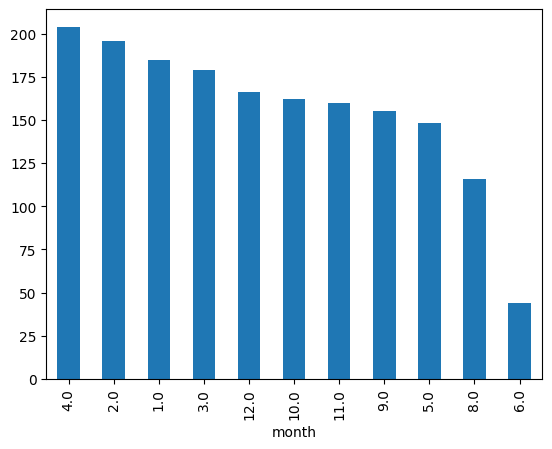

In [32]:
sdna_2023_2024['month'].value_counts().plot(kind='bar');

In [5]:
keep_values = ['Ποδόσφαιρο', 'Μπάσκετ', 'Βόλεϊ']

sdna_2023_2024['section2'] = sdna_2023_2024['section'].apply(lambda x: x if x in keep_values else 'Άλλο')

sdna_2023_2024['section2'] 


0       Ποδόσφαιρο
1       Ποδόσφαιρο
2       Ποδόσφαιρο
3          Μπάσκετ
4          Μπάσκετ
           ...    
1716    Ποδόσφαιρο
1717       Μπάσκετ
1718    Ποδόσφαιρο
1719    Ποδόσφαιρο
1720    Ποδόσφαιρο
Name: section2, Length: 1721, dtype: object

In [6]:
sdna_2023_2024['section2'].unique()

array(['Ποδόσφαιρο', 'Μπάσκετ', 'Άλλο', 'Βόλεϊ'], dtype=object)

In [18]:
section_counts2 = sdna_2023_2024['section2'].value_counts()
section_counts2

section2
Ποδόσφαιρο    1127
Μπάσκετ        367
Βόλεϊ          188
Άλλο            39
Name: count, dtype: int64

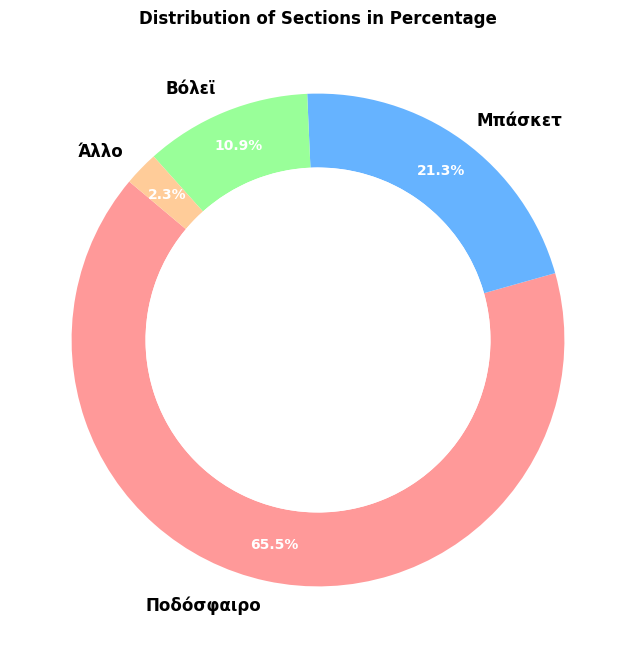

In [20]:
section_counts2 = sdna_2023_2024['section2'].value_counts()

section_counts2_perc = section_counts2 / section_counts2.sum() * 100

colors = ['#ff9999', '#66b3ff', '#99ff99', '#ffcc99']

plt.figure(figsize=(8, 8))
wedges, texts, autotexts = plt.pie(
    section_counts2_perc, 
    labels=section_counts2.index, 
    colors=colors, 
    startangle=140, 
    wedgeprops=dict(width=0.3),
    autopct='%1.1f%%',
    pctdistance=0.85  
)


centre_circle = plt.Circle((0, 0), 0.70, fc='white')
fig = plt.gcf()
fig.gca().add_artist(centre_circle)

for text in texts:
    text.set_fontsize(12)
    text.set_color('black')
    text.set_fontweight('bold')

for autotext in autotexts:
    autotext.set_fontsize(10)
    autotext.set_color('white')
    autotext.set_fontweight('bold')


plt.title('Distribution of Sections in Percentage', fontweight='bold')


plt.show()


In [23]:
lemmatized_text = ' '.join(token.lemma_ for token in full_doc)

In [24]:
lemmatized_text[:1000]

'Είμαι αλήθεια ότι σε ο αρχή ο 2015 , σε συνθήκη παρατεταμένος κρίση ο ελληνικός ποδοσφαίρου , ο τότε υφυπουργός Αθλητισμός Σταύρος Κοντονής κάνω ο σωστός επιλογή . Πήγε ο ίδιος σε ο FIFA και σε ο UEFA και πετυχαίνω ο θεσμοθέτηση ο τακτικός δικαστών και ο εν ενεργεία εισαγγελέων σε ο ΕΠΟ και σε ο Λίγκα . εκείνος ο νομοθετικός πρωτοβουλία δίνω ο έναυσμα για δομικός αλλαγή σε ο ελληνικός ποδόσφαιρο ώστε να αποκαθιστώ \xa0 ( όσο γίνομαι ) ο διαφάνεια και ο αξιοπιστία . Αλλωστε ο ποδοσφαιρικός δικαιοσύνη μαζί με ο διαιτησία αποτελώ ο δύο κορυφαίος πυλώνας ένας αθλήματος που κοντά σε ο μισός αιώνας σε ο χώρα μου , αναζητώ ο εξυγίανση . \n σε ο φίλαθλη κοινός γνώμη ο ενεργοποίηση ο τακτικός δικαστών δημιουργώ δικαιολογημένος ελπίδα ότι πολύς θα άλλαζαν . δεν θα υπάρχω επιλεκτικός τιμωρία , ο απόφαση θα έβγαιναν γρήγορα και ο παθογένεια ο ατιμωρησία θα καταργούνταν οριστικός και αμετάκλητα . \xa0\n πράγματι επί ο θητεία Κοντονή ο δικαιοδοτικός όργανο ο ποδοσφαίρος λειτούργησαν με επιμέλεια , 

In [20]:
nlp.Defaults.stop_words;


In [21]:
!pip install scikit-learn;


In [22]:
from sklearn.feature_extraction.text import CountVectorizer

In [23]:
cv = CountVectorizer(stop_words= list(nlp.Defaults.stop_words), min_df=0.01, max_df=0.95)
     

In [24]:
count_vector = cv.fit_transform(sdna_2023_2024['text'])

In [64]:
count_vector.shape

(1721, 4281)

In [25]:
results = pd.DataFrame(count_vector.toarray(), columns=cv.get_feature_names_out()) 


In [26]:
cv = CountVectorizer( stop_words= list(nlp.Defaults.stop_words), max_features=20, ngram_range=(2,2))
count_vector = cv.fit_transform(sdna_2023_2024['text'])
results = pd.DataFrame(count_vector.toarray(), columns=cv.get_feature_names_out()) 

In [75]:
results.sum(axis =0).sort_values(ascending = False)

πλέι οφ                325
εργκίν αταμάν          240
champions league       177
νέα φιλαδέλφεια        165
δεύτερο ημίχρονο       160
ελληνικό ποδόσφαιρο    147
δύο ομάδες             145
τσάμπιονς λιγκ         139
final four             130
σέντερ φορ             129
δύο γκολ               127
αγωνιστικό χώρο        116
φατίχ τερίμ            109
κάνει διαφορά          109
conference league      108
δύο φορές              102
μεγάλο βαθμό           101
καλύτερη ομάδα          99
παναθηναϊκός aktor      99
ιβάν γιοβάνοβιτς        98
dtype: int64

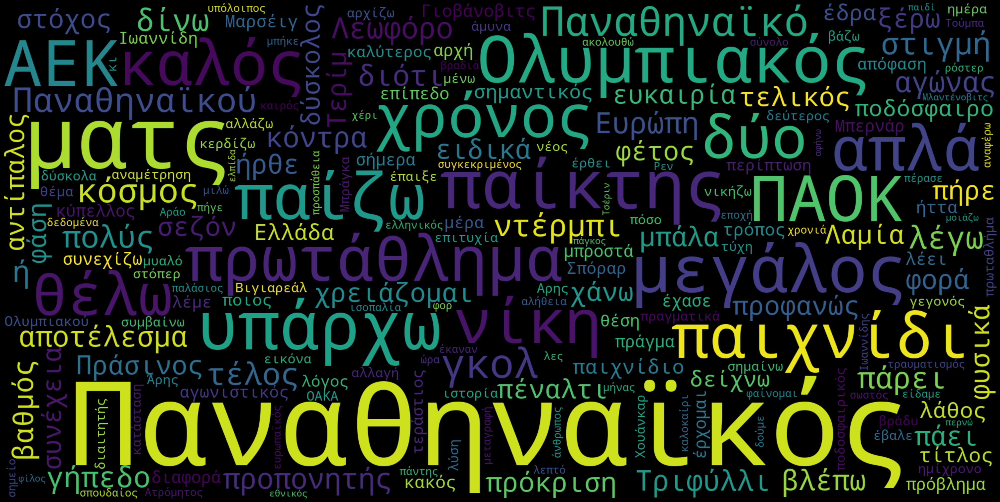

In [38]:
wordcloud_pao = WordCloud(
    stopwords=nlp.Defaults.stop_words,
    width=2000,
    height=1000,
    background_color='black',
   ).generate(lemmatized_text_pao)


fig = plt.figure(
    figsize=(40, 30),
    facecolor='k',
    edgecolor='k'
)


plt.imshow(wordcloud_pao, interpolation='bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

In [107]:
cv = CountVectorizer(stop_words= list(nlp.Defaults.stop_words), min_df=0.01, max_df=0.95)

In [109]:
count_vector = cv.fit_transform(sdna_2023_2024_pao["text"])

In [158]:
stopwords = nlp.Defaults.stop_words
stopwords.add("ομάδα")
stopwords.add("μπορώ")
stopwords.add("κάνω")
stopwords.add("γίνομαι")
stopwords.add("pamestoixima gr")
stopwords.add("ή")
stopwords.add("υπάρχω")

In [159]:
cv_august = CountVectorizer(stop_words = list(nlp.Defaults.stop_words), max_features=20, ngram_range=(2,4))
count_vector_august = cv.fit_transform(sdna_2023_2024_august["text"])
results_august= pd.DataFrame(count_vector.toarray(), columns=cv.get_feature_names_out()) 

In [157]:
results_august_sorted = results_august.sum(axis =0).sort_values(ascending = True)
results_august_sorted

μουντομπάσκετ 2023      98
νέα φιλαδέλφεια         99
ομίλους τσάμπιονς       99
ντιναμό ζάγκρεμπ       101
ελληνικό ποδόσφαιρο    102
europa league          108
υψηλού επιπέδου        109
νέα ζηλανδία           109
play off               116
εκατομμύρια ευρώ       127
σέντερ φορ             129
pamestoixima gr        130
τσάμπιονς λιγκ         139
ελληνική ομάδα         145
ιβάν γιοβάνοβιτς       147
δεύτερο ημίχρονο       160
ομίλους europa         165
champions league       177
καλή ομάδα             240
πλέι οφ                325
dtype: int64

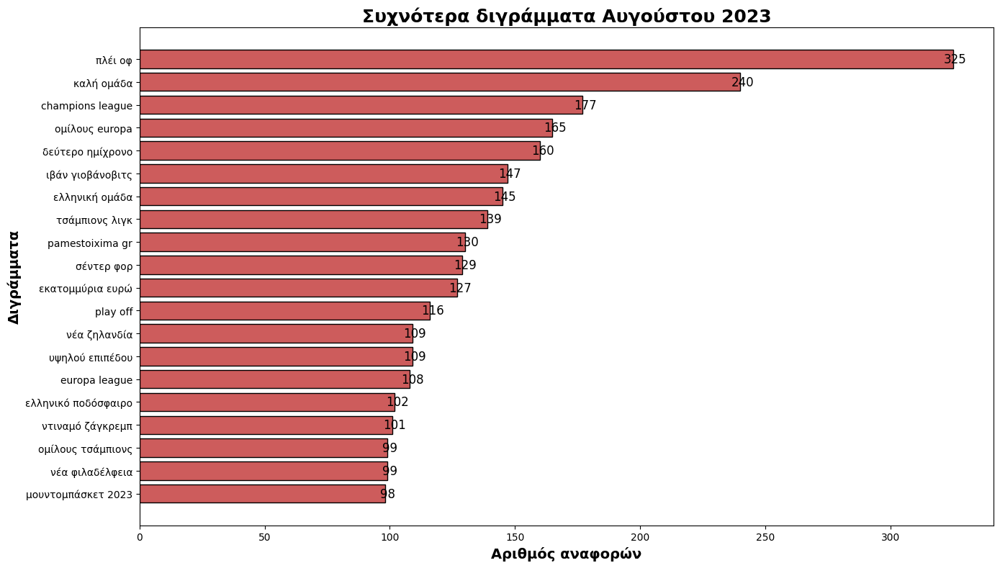

In [154]:
fig, ax = plt.subplots(figsize=(14, 8)) 
bars = ax.barh(results_august_sorted.index, results_august_sorted.values, color='indianred', edgecolor='black')


for bar in bars:
    width = bar.get_width()
    label_x_pos = width + 1 if width > 0 else width - 1
    ax.text(label_x_pos, bar.get_y() + bar.get_height() / 2, f'{width:.0f}', va='center', ha='center', color='black', fontsize=12)


ax.set_title("Συχνότερα διγράμματα Αυγούστου 2023", fontsize=18, fontweight='bold')
ax.set_xlabel('Αριθμός αναφορών', fontsize=14, fontweight='bold')
ax.set_ylabel('Διγράμματα', fontsize=14, fontweight='bold')

plt.tight_layout()
plt.show()

In [69]:
sdna_2023_2024_aek_august = sdna_2023_2024_aek[sdna_2023_2024_aek['month'] == 8.0]

In [70]:
sdna_2023_2024_aek_august_full_text = sdna_2023_2024_aek_august['text'].str.cat(sep = ' ')

In [74]:
full_doc_aek_august = nlp(sdna_2023_2024_aek_august_full_text)

In [75]:
lemmatized_text_aek_august = ' '.join(token.lemma_ for token in full_doc_aek_august)

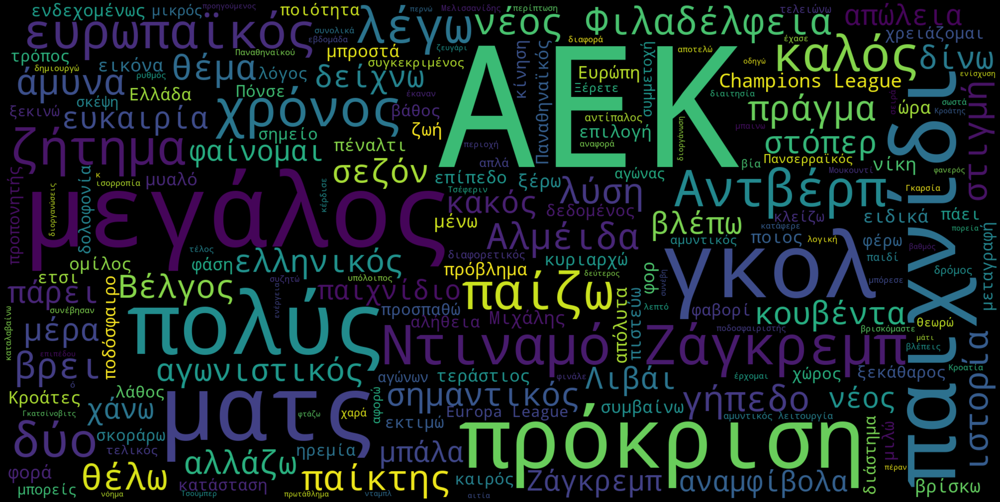

In [76]:
wordcloud_aek_august = WordCloud(
    stopwords = nlp.Defaults.stop_words,
    width = 2000,
    height = 1000,
    background_color = 'black'
 ).generate(lemmatized_text_aek_august)
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud_aek_august, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show() 

In [178]:
sdna_2023_2024_december = sdna_2023_2024[(sdna_2023_2024['month'] == 12.0) ]



In [179]:
sdna_2023_2024_december_full_text = sdna_2023_2024_december['text'].str.cat(sep = ' ')

In [101]:
full_doc_december = nlp(sdna_2023_2024_december_full_text)

In [102]:
lemmatized_text_december = ' '.join(token.lemma_ for token in full_doc_december)

In [107]:
cv_december = CountVectorizer(stop_words= list(nlp.Defaults.stop_words), max_features=20, ngram_range=(1,5))
count_vector_december = cv.fit_transform(sdna_2023_2024_december['text'])
results_december = pd.DataFrame(count_vector.toarray(), columns=cv.get_feature_names_out()) 

In [108]:
results_december_sorted = results_december.sum(axis =0).sort_values(ascending = True)
results_december_sorted

μακάμπι χάιφα            98
πάρει πρωτάθλημα         99
ραζβάν λουτσέσκου        99
παναθηναϊκός aktor      101
ιβάν γιοβάνοβιτς        102
αο θήρας                108
φετινή σεζόν            109
οπαδική βία             109
δεύτερο ημίχρονο        116
ελληνικό ποδόσφαιρο     127
τσάμπιονς λιγκ          129
γιουρόπα λιγκ           130
φατίχ τερίμ             139
εργκίν αταμάν           145
ιβάν σαββίδη            147
δύο γκολ                160
προκειμένη περίπτωση    165
champions league        177
κάνει διαφορά           240
σούπερ λιγκ             325
dtype: int64

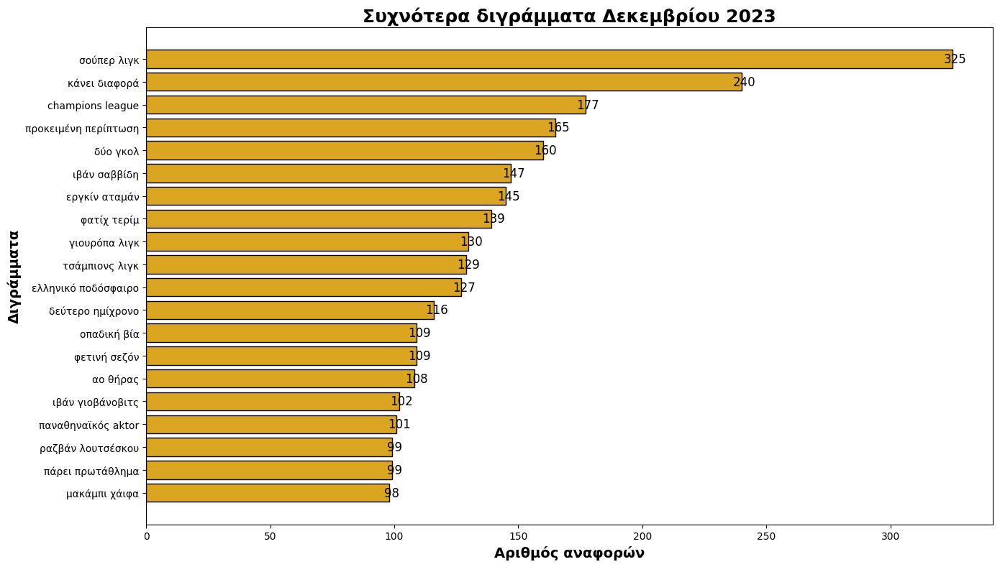

In [133]:
fig, ax = plt.subplots(figsize=(14, 8)) 
bars = ax.barh(results_december_sorted.index, results_december_sorted.values, color='goldenrod', edgecolor='black')


for bar in bars:
    width = bar.get_width()
    label_x_pos = width + 1 if width > 0 else width - 1
    ax.text(label_x_pos, bar.get_y() + bar.get_height() / 2, f'{width:.0f}', va='center', ha='center', color='black', fontsize=12)


ax.set_title("Συχνότερα διγράμματα Δεκεμβρίου 2023", fontsize=18, fontweight='bold')
ax.set_xlabel('Αριθμός αναφορών', fontsize=14, fontweight='bold')
ax.set_ylabel('Διγράμματα', fontsize=14, fontweight='bold')

plt.tight_layout()
plt.show()



In [27]:
filepath = "https://raw.githubusercontent.com/datajour-gr/DataJournalism/main/Bachelor%20Lessons%202023/Lesson%2010/NRC_GREEK_Translated_6_2020.csv"

In [28]:
emolex_df = pd.read_csv(filepath)
emolex_df.head()

,word,Positive,Negative,Anger,Anticipation,Disgust,Fear,Joy,Sadness,Surprise,Trust
0,αφεση,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,ενορκη βεβαιωση,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,εχοντας,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,εχω,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,οριο,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [29]:
emolex_df = emolex_df.drop_duplicates(subset=['word'])
emolex_df = emolex_df.dropna()
emolex_df.reset_index(inplace = True, drop=True)

In [30]:
vec = CountVectorizer(analyzer = 'word', vocabulary = emolex_df.word,
                      lowercase=False, 
                      strip_accents = 'unicode',  
                      stop_words= list(nlp.Defaults.stop_words),
                      ngram_range=(1, 2))

In [31]:
matrix = vec.fit_transform(sdna_2023_2024['text'])
vocab = vec.get_feature_names_out()
wordcount_df = pd.DataFrame(matrix.toarray(), columns=vocab)
wordcount_df.head()

C:\Users\stath\miniconda3\envs\mynewenv\Lib\site-packages\sklearn\feature_extraction\text.py:406: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['αδιακοπα', 'ακομα', 'ακομη', 'ακριβως', 'αλλα', 'αλλαχου', 'αλλες', 'αλλη', 'αλλην', 'αλλης', 'αλλιως', 'αλλιωτικα', 'αλλο', 'αλλοι', 'αλλοιως', 'αλλοιωτικα', 'αλλον', 'αλλος', 'αλλοτε', 'αλλου', 'αλλους', 'αλλων', 'αμα', 'αμεσα', 'αμεσως', 'ανα', 'αναμεσα', 'αναμεταξυ', 'ανευ', 'αντι', 'αντιπερα', 'αντις', 'ανω', 'ανωτερω', 'αξαφνα', 'απεναντι', 'απο', 'αποψε', 'αρα', 'αραγε', 'αρκετα', 'αρκετες', 'αρχικα', 'αυριο', 'αυτα', 'αυτες', 'αυτη', 'αυτην', 'αυτης', 'αυτο', 'αυτοι', 'αυτον', 'αυτος', 'αυτου', 'αυτους', 'αυτων', 'αφοτου', 'αφου', 'βεβαια', 'βεβαιοτατα', 'γιατι', 'γρηγορα', 'γυρω', 'δεινα', 'δεξια', 'δηθεν', 'δηλαδη', 'διαρκως', 'δικα', 'δικο', 'δικοι', 'δικος', 'δικου', 'δικους', 'διολου', 'διπλα', 'διχως', 'εαν', 'εαυτο', 'εαυτον', 'εαυτου', 'εαυτους', 'εαυτων', 

,αφεση,ενορκη βεβαιωση,εχοντας,εχω,οριο,ορμος,υδρα,αγια τραπεζα,αμην,απατσι,...,κλητηριο ενταλμα,κατειργασμενος,μαγια,κιτρινο,κιτρινιζω,ουρλιασμα,κροκος αυγου,νεοτερος,ζεφυρος,ζουμ
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [109]:
wordcount_df.shape

(1721, 13161)

In [32]:
positive_words = emolex_df[emolex_df.Positive == 1]['word']

In [33]:
negative_words = emolex_df[emolex_df.Negative == 1]['word']

In [35]:
joy_words = emolex_df[emolex_df.Joy == 1]['word']

In [36]:
anger_words = emolex_df[emolex_df.Anger == 1]['word']

In [34]:
sadness_words = emolex_df[emolex_df.Sadness == 1]['word']

In [37]:
surprise_words = emolex_df[emolex_df.Surprise == 1]['word']

In [38]:
anticipation_words = emolex_df[emolex_df.Anticipation == 1]['word']



In [39]:
trust_words = emolex_df[emolex_df.Trust == 1]['word']

In [41]:
fear_words = emolex_df[emolex_df.Fear == 1]['word']

In [40]:
disgust_words = emolex_df[emolex_df.Disgust == 1]['word']

In [42]:
sdna_2023_2024['positive'] = wordcount_df[positive_words].sum(axis=1)

In [43]:
sdna_2023_2024['negative'] = wordcount_df[negative_words].sum(axis=1)

In [44]:
sdna_2023_2024['joy'] = wordcount_df[joy_words].sum(axis=1)

In [45]:
sdna_2023_2024['sadness'] = wordcount_df[sadness_words].sum(axis=1)

In [46]:
sdna_2023_2024['surprise'] = wordcount_df[surprise_words].sum(axis=1)

In [47]:
sdna_2023_2024['anticipation'] = wordcount_df[anticipation_words].sum(axis=1)

In [48]:
sdna_2023_2024['trust'] = wordcount_df[trust_words].sum(axis=1)

In [49]:
sdna_2023_2024['fear'] = wordcount_df[fear_words].sum(axis=1)

In [50]:
sdna_2023_2024['disgust'] = wordcount_df[disgust_words].sum(axis=1)

In [51]:
sdna_2023_2024['datetime'] = pd.to_datetime(sdna_2023_2024['datetime'])


In [63]:
sdna_2023_2024_august = sdna_2023_2024[sdna_2023_2024['datetime'].dt.month == 8].copy()

In [64]:
sdna_2023_2024_august.set_index('datetime', inplace=True)

In [65]:
sdna_2023_2024_august['pos/neg'] = sdna_2023_2024_august['positive'] - sdna_2023_2024_august['negative']

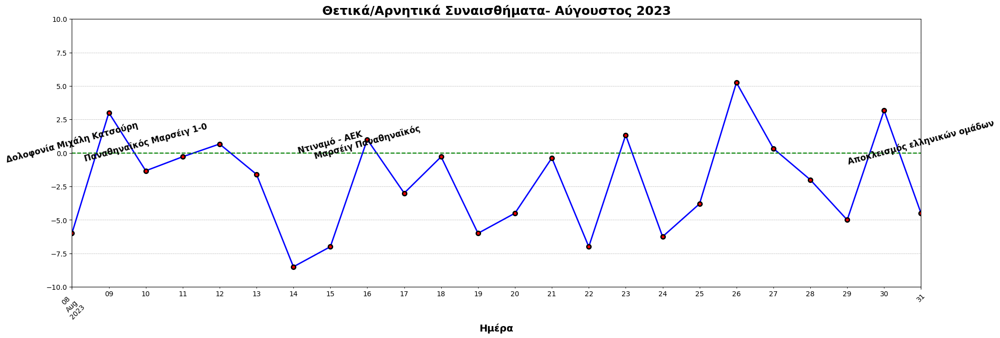

In [80]:
plt.figure(figsize=(22, 7))


sdna_2023_2024_august['pos/neg'].resample('D').mean().plot(
    linestyle='-',  
    color='b',     
    linewidth=2,    
    marker='o',   
    markersize=6,   
    markerfacecolor='red',  
    markeredgewidth=2,     
    markeredgecolor='black' 
)


plt.title('Θετικά/Αρνητικά Συναισθήματα- Αύγουστος 2023', fontsize=18, fontweight='bold')
plt.xlabel('Ημέρα', fontsize=14, fontweight='bold')
plt.axhline(y=0, color='green', linestyle='--', linewidth=1.5)
plt.ylim(-10,10)
plt.grid(True, linestyle='--', linewidth=0.5)


annotations = {
    pd.Timestamp('2023-08-08'): 'Δολοφονία Μιχάλη Κατσούρη',
    pd.Timestamp('2023-08-10'): 'Παναθηναϊκός Μαρσέιγ 1-0',
    pd.Timestamp('2023-08-15'): 'Ντιναμό - ΑΕΚ',
    pd.Timestamp('2023-08-16'): 'Μαρσέιγ Παναθηναϊκός',
 pd.Timestamp('2023-08-31'): 'Αποκλεισμός ελληνικών ομάδων'
}

for date, label in annotations.items():
    plt.text(date, 0.8, label, fontsize=12, ha='center', va='center', fontweight='bold', rotation= 15)

plt.xticks(rotation=45)  

plt.show()



In [168]:
sdna_2023_2024_december

,site,url,title,author,article_lead,text,section,year,month,day,...,joy,anger,author_gender,sadness,surprise,anticipation,trust,fear,disgust,pos/neg
datetime,,,,,,,,,,,,,,,,,,,,,
2023-12-31 23:00:00,sdna.gr,https://www.sdna.gr/podosfairo/1155742_sti-las...,Στη λάσπη απαντάς με έργα…,Σταύρος Κόλκας,Ένα βασικό λάθος που μπορεί να κάνουμε αραιά κ...,"Αφορμή για το σημερινό μου άρθρο, πήρα προφανώ...",Ποδόσφαιρο,2023.0,12.0,31.0,...,2,12,Άνδρας,7,2,10,12,11,15,2
2023-12-31 20:17:00,sdna.gr,https://www.sdna.gr/bolei/1156012_mia-hronia-m...,Μια χρονιά με φως και με σκοτάδι,Ιωάννης Καλλιτσάρης,Το 2023 ρίχνει αυλαία και ομολογουμένως ήταν μ...,Έχουμε την ευτυχία να επισημαίνουμε κάθε χρόνο...,Βόλεϊ,2023.0,12.0,31.0,...,4,14,Άνδρας,10,4,13,11,12,8,-9
2023-12-31 13:34:00,sdna.gr,https://www.sdna.gr/podosfairo/1155726_i-dipsa...,Η δίψα του Τερίμ για το πρωτάθλημα και η σωστή...,Τάσος Νικολογιάννης,Ο Τάσος Νικολογιάννης γράφει για τις πρώτες δη...,Το 2023 φεύγει και σε λίγο μπαίνουμε στο 2024....,Ποδόσφαιρο,2023.0,12.0,31.0,...,7,12,Άνδρας,10,8,9,32,11,14,-22
2023-12-30 23:34:00,sdna.gr,https://www.sdna.gr/podosfairo/1155514_aporo-t...,Απορώ… Τι τους έχει κάνει ο Λουτσέσκου;,Κώστας Βασιλόπουλος,Είναι εντυπωσιακά τα εγκώμια που έχει αποκομίσ...,Δίχως δισταγμό χαρακτηρίζουν τον Δικέφαλο «κορ...,Ποδόσφαιρο,2023.0,12.0,30.0,...,12,2,Άνδρας,3,5,6,17,3,6,9
2023-12-30 15:03:00,sdna.gr,https://www.sdna.gr/mpasket/1155353_o-panathin...,O Παναθηναϊκός ολοκλήρωσε τον πρώτο γύρο δίνον...,Θάνος Τσίμπος,Ο Θάνος Τσίμπος γράφει για την εύκολη νίκη του...,Στον τελευταίο αγώνα του πρώτου γύρου και της ...,Μπάσκετ,2023.0,12.0,30.0,...,3,23,Άνδρας,12,5,21,16,19,22,-17
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-12-01 02:35:00,sdna.gr,https://www.sdna.gr/podosfairo/1146503_otan-eh...,"Όταν έχεις μάθει να υποφέρεις, όλα είναι πιθανά…",Σταύρος Κόλκας,"Όταν όλοι είναι ένα, το αποτέλεσμα είναι δρομο...","Δεν είμαι παιδί των διθυράμβων, ούτε παλεύω να...",Ποδόσφαιρο,2023.0,12.0,1.0,...,9,6,Άνδρας,7,8,13,14,4,15,-3
2023-12-01 01:07:00,sdna.gr,https://www.sdna.gr/mpasket/1146491_mia-terast...,Μια τεράστια χαμένη ευκαιρία και μια σύμπτωση ...,Γιάννης Κουβόπουλος,Ο Παναθηναϊκός AKTOR έχασε μέσα από τα χέρια τ...,Ναι. Αυτή τη στιγμή επικρατεί μεγάλη απογοήτευ...,Μπάσκετ,2023.0,12.0,1.0,...,12,6,Άνδρας,8,10,16,22,7,10,-10
2023-12-01 00:54:00,sdna.gr,https://www.sdna.gr/bolei/1146487_oi-dyo-apohr...,Οι δύο αποχρώσεις του μαύρου,Ιωάννης Καλλιτσάρης,Το ταξίδι του ΠΑΟΚ στο CEV Cup συνεχίζεται και...,Η εικόνα του ΠΑΟΚ απέναντι στη Μλάντοστ ήταν α...,Βόλεϊ,2023.0,12.0,1.0,...,7,7,Άνδρας,7,2,10,16,10,12,-2


In [180]:
sdna_2023_2024_december = sdna_2023_2024[sdna_2023_2024['datetime'].dt.month == 12].copy()

In [181]:
sdna_2023_2024_december.set_index('datetime', inplace=True)

In [182]:
sdna_2023_2024_december['pos/neg'] = sdna_2023_2024_december['positive'] - sdna_2023_2024_december['negative']

In [188]:
sdna_2023_2024_april = sdna_2023_2024[(sdna_2023_2024['month'] == 4.0) ]

In [189]:
sdna_2023_2024_april_full_text = sdna_2023_2024_april['text'].str.cat(sep = ' ')

In [190]:
full_doc_april = nlp(sdna_2023_2024_april_full_text)

In [191]:
lemmatized_text_april = ' '.join(token.lemma_ for token in full_doc_april)

In [192]:
cv_april= CountVectorizer(stop_words= list(nlp.Defaults.stop_words), max_features=20, ngram_range=(2,5))
count_vector_april = cv.fit_transform(sdna_2023_2024_april['text'])
results_april = pd.DataFrame(count_vector.toarray(), columns=cv.get_feature_names_out()) 

In [193]:
results_april_sorted = results_april.sum(axis =0).sort_values(ascending = True)
results_april_sorted

καλύτερη ομάδα          98
πάρει πρωτάθλημα        99
πλέι οφ                 99
παναθηναϊκός aktor     101
δύο ομάδες             102
opap arena             108
φετινή σεζόν           109
νέα φιλαδέλφεια        109
αγωνιστικό χώρο        116
δεύτερο γκολ           127
ραζβάν λουτσέσκου      129
regular season         130
φατίχ τερίμ            139
δεύτερο ημίχρονο       145
ελληνικό ποδόσφαιρο    147
αεκ παοκ               160
παοκ αεκ               165
champions league       177
εργκίν αταμάν          240
πλεονέκτημα έδρας      325
dtype: int64

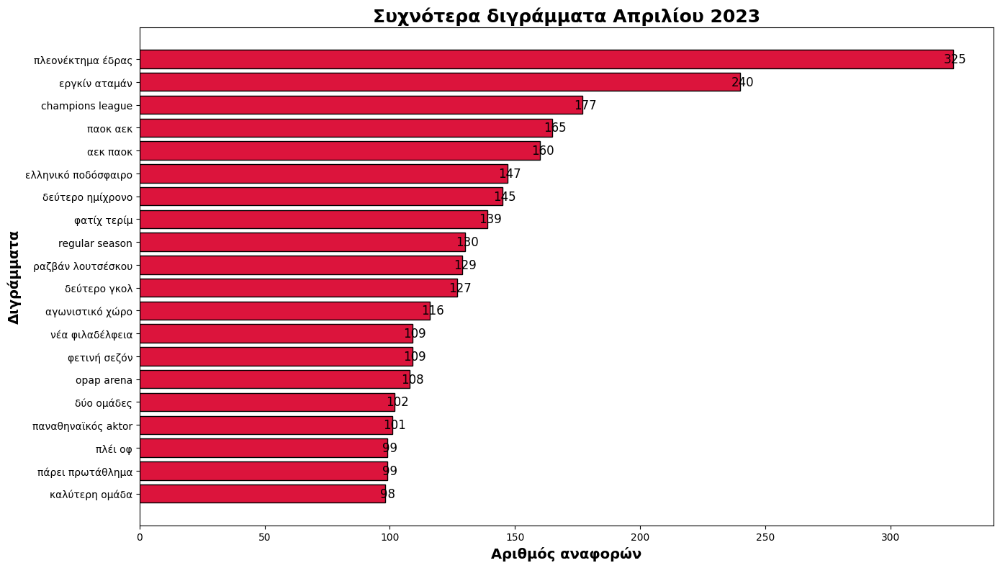

In [208]:
fig, ax = plt.subplots(figsize=(14, 8)) 
bars = ax.barh(results_april_sorted.index, results_april_sorted.values, color='crimson', edgecolor='black')


for bar in bars:
    width = bar.get_width()
    label_x_pos = width + 1 if width > 0 else width - 1
    ax.text(label_x_pos, bar.get_y() + bar.get_height() / 2, f'{width:.0f}', va='center', ha='center', color='black', fontsize=12)


ax.set_title("Συχνότερα διγράμματα Απριλίου 2023", fontsize=18, fontweight='bold')
ax.set_xlabel('Αριθμός αναφορών', fontsize=14, fontweight='bold')
ax.set_ylabel('Διγράμματα', fontsize=14, fontweight='bold')

plt.tight_layout()
plt.show()

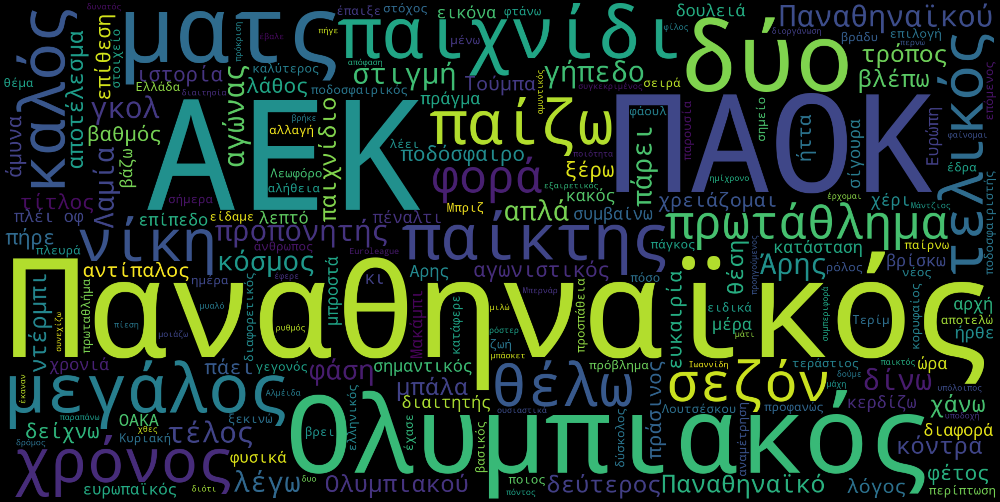

In [76]:
wordcloud_april = WordCloud(
    stopwords = nlp.Defaults.stop_words,
    width = 2000,
    height = 1000,
    background_color = 'black'
 ).generate(lemmatized_text_april)
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud_april, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show() 

In [75]:
stopwords = nlp.Defaults.stop_words
stopwords.add("ομάδα")
stopwords.add("μπορώ")
stopwords.add("κάνω")
stopwords.add("γίνομαι")
stopwords.add("pamestoixima")
stopwords.add("ή")
stopwords.add("υπάρχω")
stopwords.add("πολύς")

In [105]:
sdna_2023_2024_april = sdna_2023_2024[sdna_2023_2024['datetime'].dt.month == 4.0].copy()

In [106]:
sdna_2023_2024_april.set_index('datetime', inplace=True)

In [107]:
sdna_2023_2024_april

,site,url,title,author,article_lead,text,section,year,month,day,hour,section2,author2,positive,negative,joy,anger
datetime,,,,,,,,,,,,,,,,,
2024-04-30 18:43:00,sdna.gr,https://www.sdna.gr/podosfairo/1194113_i-ypokr...,Η υποκρισία ξεχειλίζει,Σταύρος Κόλκας,Σε μία χώρα που ο τυχοδιωκτισμός είναι εθνικό ...,"Κακές στιγμές στη δουλειά. Όλοι είχαμε, όλοι έ...",Ποδόσφαιρο,2024.0,4.0,30.0,18.0,Ποδόσφαιρο,Αρθρογράφος ΠΑΟΚ 2(Ποδόσφαιρο),21,22,6,9
2024-04-30 16:21:00,sdna.gr,https://www.sdna.gr/podosfairo/1194092_anazito...,Αναζητώντας την επιτομή του θράσους και της υπ...,Χρήστος Φασούλας,Ο Χρήστος Φασούλας αναρωτιέται μήπως στην επόμ...,Όταν το ιστορικό σου είναι βεβαρημένο με αλλεπ...,Ποδόσφαιρο,2024.0,4.0,30.0,16.0,Ποδόσφαιρο,Αρθρογράφος 10,3,7,0,1
2024-04-30 12:05:00,sdna.gr,https://www.sdna.gr/mpasket/1194018_berolino-p...,Το Βερολίνο περνάει από το… Βελιγράδι,Γιάννης Κουβόπουλος,Ο Γιάννης Κουβόπουλος γράφει για την πολύ ιδια...,Ο Παναθηναϊκός AKTOR βρίσκεται από χθες το μεσ...,Μπάσκετ,2024.0,4.0,30.0,12.0,Μπάσκετ,Αρθρογράφος Παναθηναϊκού 1(Μπάσκετ),12,25,5,5
2024-04-29 23:10:00,sdna.gr,https://www.sdna.gr/podosfairo/1193919_podosfa...,"Το ποδόσφαιρο λέει ΠΑΟΚ, ο Άρης λέει ποιος (δε...",Βασίλης Παπαθεοδώρου,Ο Βασίλης Παπαθεοδώρου έχει ένα νέο σημείωμα γ...,Δυόμισι στροφές πριν το φινάλε κι οι διεκδικητ...,Ποδόσφαιρο,2024.0,4.0,29.0,23.0,Ποδόσφαιρο,Αρθρογράφος 7,16,16,6,8
2024-04-29 22:13:00,sdna.gr,https://www.sdna.gr/bolei/1193905_i-kardia-kai...,Η καρδιά και το μυαλό του Παναθηναϊκού,Ιωάννης Καλλιτσάρης,Η δύναμη κάθε ομάδας είναι πάντα το σύνολό της...,Όταν τα πράγματα έγιναν δύσκολα και ο Παναθηνα...,Βόλεϊ,2024.0,4.0,29.0,22.0,Βόλεϊ,Αρθρογράφος Βόλει,18,26,4,11
2024-04-29 22:10:00,sdna.gr,https://www.sdna.gr/podosfairo/1193622_alli-mi...,Άλλη μια σελίδα στο εγχειρίδιο πως να καταστρέ...,Λευτέρης Μπακολιάς,"Η ελπίδα σμπαραλιάστηκε, ο Παναθηναϊκός χάνει ...",Μια ομάδα που ξεκινούσε τη σεζόν με βάση της τ...,Ποδόσφαιρο,2024.0,4.0,29.0,22.0,Ποδόσφαιρο,Αρθρογράφος Παναθηναϊκού 2(Ποδόσφαιρο),17,23,3,10
2024-04-29 21:10:00,sdna.gr,https://www.sdna.gr/podosfairo/1193858_o-paok-...,Ο ΠΑΟΚ τιμώρησε την αλαζονεία! Κρίμα για τον Α...,Κώστας Βασιλόπουλος,Η αλαζονεία που επέδειξε τα τελευταία 24ωρα ο ...,"Sorry guys αλλά, να θεωρείτε δεδομένο πως θα κ...",Ποδόσφαιρο,2024.0,4.0,29.0,21.0,Ποδόσφαιρο,Αρθρογράφος ΠΑΟΚ 4(Ποδόσφαιρο),19,16,4,9
2024-04-29 16:34:00,sdna.gr,https://www.sdna.gr/podosfairo/1193776_i-epist...,Η επιστήμη σηκώνει τα χέρια ψηλά,Κώστας Μανωλιουδάκης,"Στη ζωή, όπως και στο ποδόσφαιρο, όπως στρώνει...",Είναι πραγματικά εντυπωσιακό πώς ένας άνθρωπος...,Ποδόσφαιρο,2024.0,4.0,29.0,16.0,Ποδόσφαιρο,NaN,14,17,7,9
2024-04-29 14:55:00,sdna.gr,https://www.sdna.gr/podosfairo/1193808_heirokr...,Το χειροκρότημα στον Σαμάτα,Κώστας Κεφαλογιάννης,"Οι παίκτες, ο Λουτσέσκου, η διοίκηση, όσοι πάν...","Ας ξεκινήσουμε ανάποδα, κόντρα στο πανηγυρικό ...",Ποδόσφαιρο,2024.0,4.0,29.0,14.0,Ποδόσφαιρο,Αρθρογράφος ΠΑΟΚ 3(Ποδόσφαιρο),34,27,13,5


In [108]:
sdna_2023_2024_april['pos/neg'] = sdna_2023_2024_april['positive'] - sdna_2023_2024_april['negative']

In [145]:
female_authors = ["Αργυρώ Γιαννουδάκη", "Βάσω Πρεβεζιάνου", "Βίκυ Γεωργάτου"]
def author_gender(row):
    if row['author'] in female_authors:
        return 'Γυναίκα'
    else:
        return 'Άνδρας'
sdna_2023_2024['author_gender'] = sdna_2023_2024.apply(author_gender, axis=1)
                                                          

In [142]:
sdna_2023_2024['author_gender'].value_counts()

author_gender
male      1696
female      25
Name: count, dtype: int64

In [81]:
sdna_2023_2024['pos/neg'] = sdna_2023_2024['positive'] - sdna_2023_2024['negative']


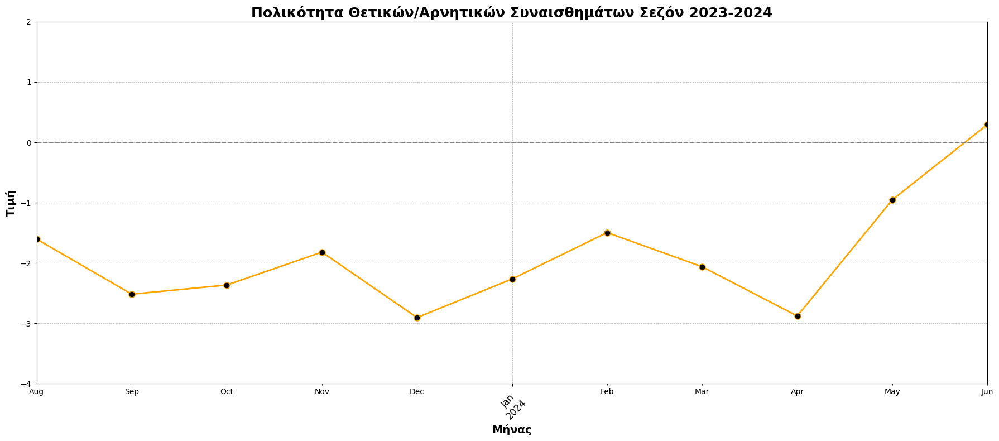

In [98]:
monthly_pos_neg = sdna_2023_2024.set_index('datetime')['pos/neg'].resample('ME').mean()

plt.figure(figsize=(18, 8)) 

monthly_pos_neg.plot(
    linestyle='-',  
    color='orange',      
    linewidth=2,    
    marker='o',   
    markersize=8,      
    markerfacecolor='black',  
    
       
)


plt.title('Πολικότητα Θετικών/Αρνητικών Συναισθημάτων Σεζόν 2023-2024', fontsize=18, fontweight='bold')
plt.xlabel('Μήνας', fontsize=14, fontweight='bold')
plt.ylabel('Τιμή', fontsize=14, fontweight='bold')


plt.ylim(-4, 2)
plt.grid(True, linestyle='--', linewidth=0.5)

plt.axhline(y=0, color='grey', linestyle='--', linewidth=1.5)
plt.xticks(rotation=45, fontsize=12)
plt.tight_layout()
plt.show()


In [95]:
monthly_pos_neg

datetime
2023-08-31   -1.603448
2023-09-30   -2.516129
2023-10-31   -2.364198
2023-11-30   -1.818750
2023-12-31   -2.903614
2024-01-31   -2.264865
2024-02-29   -1.494898
2024-03-31   -2.061453
2024-04-30   -2.877451
2024-05-31   -0.952703
2024-06-30    0.295455
Name: pos/neg, dtype: float64

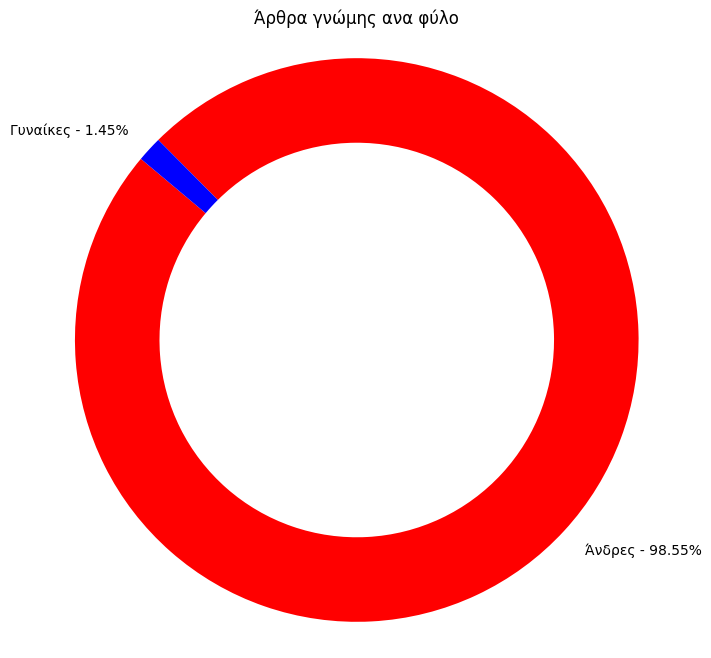

In [97]:
author_counts = {'Άνδρες': 1696, 'Γυναίκες': 25}
author_counts_series = pd.Series(author_counts)
percentages = author_counts_series / author_counts_series.sum() * 100
size_of_groups = author_counts_series.values

if 'title' in locals():
    del title

plt.figure(figsize=(8, 8))
plt.pie(
    size_of_groups,
    labels=[f"{label} - {percentage:.2f}%" for label, percentage in zip(author_counts_series.index, percentages)],
    startangle=140,
    colors=['red', 'blue'],
    wedgeprops={'width': 0.3}  # Adjust the width to create a donut chart
)
plt.title('Άρθρα γνώμης ανα φύλο')
plt.axis('equal')  

plt.show()
